# Inferential statistics
IN this notebook we merge crime and socio economic data and then perform a range of statistical analyses to understand which characteristics have an effect on the levels of serious violent crime in an area. The steps performed in this notebook are as follows:

## 1. Load and merge crime and socio economic data
Load the datasets created in notebooks 1_2 and 1_3 and merge into a single dataset.

## 2. Identify most important features
The first step is to identify which features are most highly correlated with the level of serious violent crime.
- For this we will use the spearman correlation, because this is a median rather than mean based statistical measure, which is necessary because, as we'd established previously, a number of our features have skewed distributions and so a robust measure is needed to compare like with like across all our features.
- The output from this step will be a dataset containing 4835 LSOAs, for which we will have: 
    - The characteristics (or features) for each of those areas that are most highly correlated with serious violent crime
    - the serious violent crime rate per 1000 inhabitants for each area.

## 3. Derive effect sizes and confidence intervals
We then want to look at areas with high, medium and low serious violent crime rates in order to understand whether the characteristics in those areas are measurably different. This difference is called an effect size, and we will use the Cohen's D statistical measure in order to calculate it.
    - It should be noted that Cohen's D is a mean based measure and so we need to ensure our distributions are nearly normal in order for us to be able to rely on its results. This means we may need to revisit our approach to pruning outliers (as discussed previously when we performed socioeconomic distribution analysis). 
    
In our crime context analysis, we found that the top 250 LSOAs (out of nearly 5,000) experienced almost 19% of the crime in London. This means we can't simply split our data into 3 subsets of around 1700 LSOAs because that will obscure the fact that there are particular areas which have very high crime rates and it is the conditions in these areas that we are particularly interested in. We therefore propose creating subsets of data containing 250 and 500 LSOAs so that we capture the nuances about an area. For example, if the slice size is 250, we will create one slice containing the 250 LSOAs with the highest crime, another with 250 LSOAs experiencing mid level crime and the final slice containing 250 LSOAs with the least crime. For these slices (250 and 500), we will then produce the following:
- distribution and outlier analysis for each slice
- cohens D comparing size of effect in each feature between populations of high vs mid level crime, high vs low level crime and mid vs low level crime
- we will also derive the confidence interval for this effect size

<b> It should be noted we retrospectively repeated our analysis for a slice of size 1000 because a random forest classifier training on this sized cohort produced the best prediction results and so we wanted to see how it performed in the inference analysis </b>

## 4. Conclusions
Having performed this analysis we will then understand whether there is a material difference in the characteristics of areas experiencing high, mid and low levels of serious violent crime.

- also need to remember we haven't done any analysis of exclusions, looked after children and mental health yet


In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import altair as alt
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
import numpy as np

## 1. Load data

### 1.1 Load socioeconomic data

In [2]:
london_features = pd.read_csv("./DataSources/Income and Deprivation/socio_economic_features.csv")
print(london_features.shape)
london_features.head()

(4835, 28)


,lsoa_code,lsoa_name,lad_code,lad_name,income_deprivation_score,employment_deprivation_score,child_income_deprivation_score,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,...,degree_educated_pct,population_density,median_house_price,living_environment_rank,log_rent_social_pct,log_ethnic_other_pct,log_population_density,log_median_house_price,log_ethnic_black_pct,log_ethnic_asian_pct
0,E01000001,City of London 001A,E09000001,City of London,0.007,0.010,0.006,0.026256,0.845051,0.036860,...,0.776,0.140067,0.132214,0.269817,-3.057608,-3.763250,-1.965633,-2.023336,-4.891715,-2.437580
1,E01000002,City of London 001B,E09000001,City of London,0.034,0.027,0.037,0.026506,0.887187,0.037604,...,0.792,0.077879,0.157300,0.452779,-2.847312,-5.072392,-2.552593,-1.849602,-5.883322,-2.715740
2,E01000003,City of London 001C,E09000001,City of London,0.086,0.086,0.052,0.059976,0.783804,0.040862,...,0.568,0.284826,0.082149,0.141734,-1.018877,-4.069398,-1.255877,-2.499220,-3.398230,-2.080929
3,E01000005,City of London 001E,E09000001,City of London,0.211,0.136,0.209,0.094218,0.513706,0.059898,...,0.345,0.075522,0.066430,0.325527,-0.403467,-3.064000,-2.583326,-2.711609,-2.287471,-1.279514
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,0.117,0.059,0.155,0.099448,0.327070,0.034058,...,0.329,0.144255,0.034776,0.368210,-3.411248,-3.528124,-1.936171,-3.358826,-2.263997,-0.682052


### 1.2 Load and merge crime data
We remember from our crime analysis that if we bound our distribution to LSOAs where the crime_per_1000 is less than 26.5 (which are the upper and lower fences in the boxplot), we remove the extreme outliers and the remaining distribution is more close to normal. Doing so only removes 321 of 4,827 observations (LSOAs), which is around 6.5% (LSOAs) of our overall distribution. This will be our strategy for the inferential statistics

In [3]:
london_crimes = pd.read_csv("./DataSources/Crime and outcomes/violent_crimes.csv")
crimes_subset = london_crimes[(london_crimes.crime_per_1000 < 26.5)].copy()
print(crimes_subset.shape)
crimes_subset.head()

(4506, 9)


,lsoa_code,borough,ldn_datastore_total,police_total,LSOA Code,lsoa_name,population,crime_per_1000,crime_per_1000_proportion
0,E01000006,Barking and Dagenham,27,50.0,E01000006,Barking and Dagenham 016A,2094,12.893983,0.218365
2,E01000008,Barking and Dagenham,23,89.0,E01000008,Barking and Dagenham 015B,1597,14.402004,0.243903
5,E01000011,Barking and Dagenham,13,49.0,E01000011,Barking and Dagenham 016C,1726,7.531866,0.127555
6,E01000012,Barking and Dagenham,24,54.0,E01000012,Barking and Dagenham 015D,2343,10.243278,0.173474
7,E01000013,Barking and Dagenham,49,134.0,E01000013,Barking and Dagenham 013A,1855,26.415094,0.447350


In [4]:
violence_socio_economic = pd.merge(crimes_subset, london_features, left_on='lsoa_code', 
                            right_on='lsoa_code', how = 'inner')

violence_socio_economic.rename(columns = {'lsoa_name_x':'lsoa_name'}, inplace = True)
violence_socio_economic.drop('lsoa_name_y', axis=1, inplace=True)
violence_socio_economic.drop('LSOA Code', axis=1, inplace=True)

print(violence_socio_economic.shape)
violence_socio_economic.head()

(4506, 34)


,lsoa_code,borough,ldn_datastore_total,police_total,lsoa_name,population,crime_per_1000,crime_per_1000_proportion,lad_code,lad_name,...,degree_educated_pct,population_density,median_house_price,living_environment_rank,log_rent_social_pct,log_ethnic_other_pct,log_population_density,log_median_house_price,log_ethnic_black_pct,log_ethnic_asian_pct
0,E01000006,Barking and Dagenham,27,50.0,Barking and Dagenham 016A,2094,12.893983,0.218365,E09000002,Barking and Dagenham,...,0.329,0.144255,0.034776,0.368210,-3.411248,-3.528124,-1.936171,-3.358826,-2.263997,-0.682052
1,E01000008,Barking and Dagenham,23,89.0,Barking and Dagenham 015B,1597,14.402004,0.243903,E09000002,Barking and Dagenham,...,0.242,0.100393,0.012705,0.300409,-0.406466,-3.371840,-2.298662,-4.365794,-0.989502,-1.487060
2,E01000011,Barking and Dagenham,13,49.0,Barking and Dagenham 016C,1726,7.531866,0.127555,E09000002,Barking and Dagenham,...,0.296,0.215516,0.031008,0.149252,-2.563950,-3.548639,-1.534720,-3.473518,-2.435942,-0.423372
3,E01000012,Barking and Dagenham,24,54.0,Barking and Dagenham 015D,2343,10.243278,0.173474,E09000002,Barking and Dagenham,...,0.331,0.172241,0.023256,0.188331,-1.509593,-3.765946,-1.758862,-3.761200,-1.277258,-1.035423
4,E01000013,Barking and Dagenham,49,134.0,Barking and Dagenham 013A,1855,26.415094,0.447350,E09000002,Barking and Dagenham,...,0.169,0.099503,0.021318,0.296840,-0.939048,-5.805135,-2.307566,-3.848211,-1.765599,-2.308627


## 2. Identify most important features

In [5]:
import scipy.stats as stats
def PearsonSpearman(feature, outcome, feature_desc):
    corrSpearman, pValSpearman = stats.spearmanr(feature, outcome)
    correlation_result = {'Feature': feature_desc, 'Spearman Correlation': corrSpearman, 'Spearman Pvalue': pValSpearman}
    
    return correlation_result

correlation_results = pd.DataFrame(columns=['Feature', 'Spearman Correlation', 'Spearman Pvalue'])

# <------------------------------ Correlations using original values ---------------------------->

correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, violence_socio_economic.child_income_deprivation_score, 
                                                                 'child income deprivation'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, violence_socio_economic.income_deprivation_score, 
                                                                 'income deprivation'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, violence_socio_economic.employment_deprivation_score, 
                                                                 'employment deprivation'), ignore_index=True)

correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.lone_parent_pct, 
                                                                 'lone parent'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.ethnic_white_pct, 
                                                                 'ethnic white'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.ethnic_mixed_pct, 
                                                                 'ethnic mixed'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.homeowner_outright_pct, 
                                                                 'home owner'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.rent_private_pct, 
                                                                 'private renters'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.no_qualifications_pct, 
                                                                 'no qualifications'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.degree_educated_pct, 
                                                                 'degree educated'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.living_environment_rank, 
                                                                 'living environment'), ignore_index=True)

# <------------------------------ Correlations using log values ---------------------------->

correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.log_rent_social_pct, 
                                                                 'log(social housing)'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.log_ethnic_asian_pct, 
                                                                 'log(ethnic asian)'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.log_ethnic_black_pct, 
                                                                 'log(ethnic black)'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.log_ethnic_other_pct, 
                                                                 'log(ethnic other)'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.log_population_density, 
                                                                 'log(population_density)'), ignore_index=True)
correlation_results = correlation_results.append(PearsonSpearman(violence_socio_economic.crime_per_1000, 
                                                                 violence_socio_economic.log_median_house_price, 
                                                                 'log(median_house_price)'), ignore_index=True)


sorted_correlations = correlation_results.sort_values(by='Spearman Correlation', ascending=False)

In [6]:
bars_1 = alt.Chart(sorted_correlations, title='Speaman correlations between features and crime/1000').mark_bar(opacity=0.6, color='firebrick').encode(
    x=alt.X('Spearman Correlation:Q', axis=alt.Axis(title='correlation', ticks=False, values=[-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5])),
    y=alt.Y('Feature:N', axis=alt.Axis(title=None, ticks=False), sort='-x')
)

text_1 = alt.Chart(sorted_correlations).mark_text(
    align='center',
    baseline='middle',
    color='black',
    dx=20  # Nudges text to left so it doesn't appear on top of the bar
).encode(
    x=alt.X('Spearman Correlation:Q', axis=alt.Axis(title='correlation', ticks=False, values=[0, 0.1, 0.2, 0.3, 0.4, 0.5])),
    y=alt.Y('Feature:N', axis=alt.Axis(title=None, ticks=False), sort='-x'),
    text=alt.Text('Spearman Correlation:Q', format=',.3r')
)

(bars_1 + text_1).configure_axis(
    grid=False,
    domain=False
).configure_view(
    strokeWidth=0).properties(height=400, width=500)

alt.LayerChart(...)

### Comments
A moderate correlation between two variables has a Spearman correlation above 0.5 and so the following features can be considered to have a moderate correlation:
- income deprivation
- child income deprivation
- employment deprivation
- log(social housing)
- home owner (which is inversely correlated)

The remaining features have low correlation and so we will not consider them further.
- This means we will not revisit housing_rank and education_rank data discarded in the socioeconomic analysis step.

It should be noted that the features most highly correlated with crime in 2019 use data that was also collected in 2019 whereas the other data was taken from the London Atlas, which was based on 2011 data. This means it is not possible to conclude that these features are far less correlated because we don't know the extent to which their correlations with crime were reduced by virtue of being 8 years out of date. This will be reported in our results.

We will now drill into the moderately correlated variables, focusing specifically on those with the highest correlations, namely income, child income and employment deprivation.

In [7]:
chart_1 = alt.Chart(violence_socio_economic, title='child income deprivation vs crime/1000').mark_point().encode(
    x=alt.X('child_income_deprivation_score:Q', axis=alt.Axis(title='child income deprivation', ticks=False, values=[0.2,0.4])),
    y=alt.Y('crime_per_1000:Q', axis=alt.Axis(title='crime/1000', ticks=False, values=[0,20,40,60])), 
    tooltip=['lsoa_name:N', 'crime_per_1000']
)

line_1 = chart_1.transform_regression('child_income_deprivation_score', 'crime_per_1000').mark_line(color='red')

text_1 = alt.Chart(violence_socio_economic).transform_regression(
    'child_income_deprivation_score', 'crime_per_1000', params=True
).mark_text(align='left').encode(
    x=alt.value(80),  # pixels from left
    y=alt.value(10),  # pixels from top
    text=alt.Text('rSquared:N', format=',.3r')
)

text_1_2 = alt.Chart({'values':[{'x': 0.1, 'y': 29}]}).mark_text(
    text='r^2 ='
).encode(
    x='x:Q', y='y:Q'
)

child_income_chart = (chart_1 + line_1 + text_1 + text_1_2).properties(height=300, width=300)

In [8]:
chart_2 = alt.Chart(violence_socio_economic, title='income deprivation vs crime/1000').mark_point().encode(
    x=alt.X('income_deprivation_score:Q', axis=alt.Axis(title='income deprivation', ticks=False, values=[0.2,0.4])),
    y=alt.Y('crime_per_1000:Q', axis=None), 
    tooltip=['lsoa_name:N', 'crime_per_1000']
)

line_2 = chart_2.transform_regression('income_deprivation_score', 'crime_per_1000').mark_line(color='red')

text_2 = alt.Chart(violence_socio_economic).transform_regression(
    'income_deprivation_score', 'crime_per_1000', params=True
).mark_text(align='left').encode(
    x=alt.value(85),  # pixels from left
    y=alt.value(10),  # pixels from top
    text=alt.Text('rSquared:N', format=',.3r')
)

text_2_2 = alt.Chart({'values':[{'x': 0.1, 'y': 29}]}).mark_text(
    text='r^2 ='
).encode(
    x='x:Q', y='y:Q'
)

income_chart = (chart_2 + line_2 + text_2 + text_2_2).properties(height=300, width=300)

In [9]:
chart_3 = alt.Chart(violence_socio_economic, title='employment deprivation vs crime/1000').mark_point().encode(
    x=alt.X('employment_deprivation_score:Q', axis=alt.Axis(title='employment deprivation', ticks=False, values=[0.1,0.2,0.3])),
    y=alt.Y('crime_per_1000:Q', axis=None), 
    tooltip=['lsoa_name:N', 'crime_per_1000']
)

line_3 = chart_3.transform_regression('employment_deprivation_score', 'crime_per_1000').mark_line(color='red')

text_3 = alt.Chart(violence_socio_economic).transform_regression(
    'employment_deprivation_score', 'crime_per_1000', params=True
).mark_text(align='left').encode(
    x=alt.value(104),  # pixels from left
    y=alt.value(10),  # pixels from top
    text=alt.Text('rSquared:N', format=',.3r')
)

text_3_2 = alt.Chart({'values':[{'x': 0.1, 'y': 29}]}).mark_text(
    text='r^2 ='
).encode(
    x='x:Q', y='y:Q'
)

employment_chart = (chart_3 + line_3 + text_3 + text_3_2).properties(height=300, width=300)

In [10]:
(child_income_chart | income_chart | employment_chart).configure_axis(
    grid=False,
    domain=False
).configure_view(
    strokeWidth=0)

alt.HConcatChart(...)

### Comments
The correlations were observed were significantly lower than those observed in the GLA analysis but we do replicate their broad conclusion that deprivation is a leading correlate with crime, albeit in our case this is just a moderate correlation. 

However, the bottom left quadrants of these scatter plots are most highly populated quadrants and these quadrants represent areas with lower crime and lower deprivation. Meanwhile, the bottom right quadrant is where we see areas with high deprivation and low crime rates and this is more sparsely populated. 

## 3. Derive effect sizes and confidence intervals
We will investigate our most highly correlated features further using Cohen's D for samples from different segments within the population. We will specifically derive the Cohen's D for child income deprivation, income deprivation and employment deprivation for the following populations:
- High Crime vs Low Crime
- High Crime vs Medium Crime
- Medium Crime vs Low Crime

However we first need to reload our crime data and strip out Westminster LSOAs from the dataset. We need to load this second dataset because the crime data used previously excluded values with crime_1000 below 26.5

In [11]:
remove_list = ['Westminster 018A', 'Westminster 013E', 'Westminster 018C', 'Westminster 013B']

print(london_crimes.shape)
crimes_subset_new = london_crimes[~london_crimes.lsoa_name.isin(remove_list)].copy()
print(crimes_subset_new.shape)

deprivation = london_features[['lsoa_code', 
                               'lsoa_name', 
                               'lad_code', 
                               'lad_name', 
                               'income_deprivation_score', 
                               'employment_deprivation_score', 
                               'child_income_deprivation_score']].copy()

print(deprivation.shape)

(4827, 9)
(4823, 9)
(4835, 7)


In [12]:
violence_deprivation = pd.merge(crimes_subset_new, deprivation, left_on='lsoa_code', 
                            right_on='lsoa_code', how = 'inner')

violence_deprivation.rename(columns = {'lsoa_name_x':'lsoa_name'}, inplace = True)
violence_deprivation.drop('lsoa_name_y', axis=1, inplace=True)

print(violence_deprivation.shape)
violence_deprivation.head()

(4823, 14)


,lsoa_code,borough,ldn_datastore_total,police_total,LSOA Code,lsoa_name,population,crime_per_1000,crime_per_1000_proportion,lad_code,lad_name,income_deprivation_score,employment_deprivation_score,child_income_deprivation_score
0,E01000006,Barking and Dagenham,27,50.0,E01000006,Barking and Dagenham 016A,2094,12.893983,0.218365,E09000002,Barking and Dagenham,0.117,0.059,0.155
1,E01000007,Barking and Dagenham,130,188.0,E01000007,Barking and Dagenham 015A,2502,51.958433,0.879936,E09000002,Barking and Dagenham,0.207,0.107,0.253
2,E01000008,Barking and Dagenham,23,89.0,E01000008,Barking and Dagenham 015B,1597,14.402004,0.243903,E09000002,Barking and Dagenham,0.265,0.151,0.298
3,E01000009,Barking and Dagenham,52,115.0,E01000009,Barking and Dagenham 016B,1929,26.956973,0.456527,E09000002,Barking and Dagenham,0.187,0.109,0.194
4,E01000010,Barking and Dagenham,211,430.0,E01000010,Barking and Dagenham 015C,3579,58.955015,0.998426,E09000002,Barking and Dagenham,0.169,0.073,0.220


### 3.1 Create sample cohorts for high, medium and low crime
we have 4835 LSOAs so I want to see the distributions for different sized slices of the data. We will try 250, 500 and 1000. 
- The reason we look at size=250 slices (excluding Westminister nightlife) is because we know from our London context analysis that top 250 suffer around 19% of the total serious violent crime rate (though this will be slightly lower given we exclude Westminister). 
- The reason we initially looked at size=500 rather than 1000 is because it is still granular enough to capture concentrations of crime into fewer LSOAs 
- We retrospectively came back and looked at size=1000 because using this cohort size produced the best prediction results when training our random forest classifier model.
- We also exclude the top/bottom 25 crime areas because they will skew results (for example, out slice of 250 top crime areas will in reality contain areas 25-275)

First we define our functions to get_chorts, display_boxplots, display_distributions, cohens_d

In [13]:
def get_cohorts(df, target_variable, cohort_size, buffer):
    
    mid_point = int(df.shape[0] / 2)
    high_violence = df.sort_values(by=target_variable, ascending=False)[buffer:buffer+cohort_size]
    mid_violence = df.sort_values(by=target_variable, ascending=False)[mid_point:mid_point+cohort_size]
    low_violence = df.sort_values(by=target_variable, ascending=True)[buffer:buffer+cohort_size]

    sum_all_crime_1000 = violence_deprivation.crime_per_1000.sum()
    pct_high_violence = high_violence[target_variable].sum() / sum_all_crime_1000
    pct_mid_violence = mid_violence[target_variable].sum() / sum_all_crime_1000
    pct_low_violence = low_violence[target_variable].sum() / sum_all_crime_1000
    
    high_violence['crime_cohort'] = 'high'
    mid_violence['crime_cohort'] = 'mid'
    low_violence['crime_cohort'] = 'low'

    print("\nTop {} proportion = {:.2%}, middle {} proportion = {:.2%}, bottom {} proportion = {:.2%} \n".format(cohort_size, pct_high_violence, cohort_size, pct_mid_violence, cohort_size, pct_low_violence))
    
    all_cohorts = high_violence.copy()
    all_cohorts = all_cohorts.append(mid_violence)
    all_cohorts = all_cohorts.append(low_violence)
    
    print('cohort shape')
    print(all_cohorts.shape)
    
    return all_cohorts

In [14]:
import plotly.express as px
def display_box_plots(all_cohorts):

    # first tidy table
    all_cohorts_tidy = pd.melt(all_cohorts, id_vars=['crime_cohort'], 
                        value_vars=['income_deprivation_score', 
                                    'child_income_deprivation_score',
                                    'employment_deprivation_score'], var_name = 'feature', value_name='value')

    fig = plt.figure(figsize = (5,5))
    fig = px.box(all_cohorts_tidy, x="crime_cohort", y="value", color="feature")
    fig.show()

In [59]:
# THis function was created retrospectively once I knew which combinations were important
def display_child_employment_distributions(all_cohorts):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(18,6))
    fig.suptitle('Distributions for high, mid crime for child income and employment related deprivation')
        
    sns.kdeplot(all_cohorts['child_income_deprivation_score'][all_cohorts.crime_cohort=='high'], label='high crime', ax=ax1)
    sns.kdeplot(all_cohorts['child_income_deprivation_score'][all_cohorts.crime_cohort=='mid'], label='mid crime', ax=ax1)
    ax1.set_xlabel('child_income_deprivation_score')
    
    sns.kdeplot(all_cohorts['employment_deprivation_score'][all_cohorts.crime_cohort=='high'], label='high crime', ax=ax2)
    sns.kdeplot(all_cohorts['employment_deprivation_score'][all_cohorts.crime_cohort=='mid'], label='mid crime', ax=ax2)
    ax2.set_xlabel('employment_deprivation_score')

    plt.show()

In [15]:
def display_distributions(all_cohorts):
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(18,6))
    fig.suptitle('Distributions for high, mid, low crime for income, child income and employment related deprivation')
  
    sns.kdeplot(all_cohorts['income_deprivation_score'][all_cohorts.crime_cohort=='high'], label='high crime', ax=ax1)
    sns.kdeplot(all_cohorts['income_deprivation_score'][all_cohorts.crime_cohort=='mid'], label='mid crime', ax=ax1)
    sns.kdeplot(all_cohorts['income_deprivation_score'][all_cohorts.crime_cohort=='low'], label='low crime', ax=ax1)
    ax1.set_xlabel('income_deprivation_score')
    ax1.set_ylabel('frequency')
        
    sns.kdeplot(all_cohorts['child_income_deprivation_score'][all_cohorts.crime_cohort=='high'], label='high crime', ax=ax2)
    sns.kdeplot(all_cohorts['child_income_deprivation_score'][all_cohorts.crime_cohort=='mid'], label='mid crime', ax=ax2)
    sns.kdeplot(all_cohorts['child_income_deprivation_score'][all_cohorts.crime_cohort=='low'], label='low crime', ax=ax2)
    ax2.set_xlabel('child_income_deprivation_score')
    
    sns.kdeplot(all_cohorts['employment_deprivation_score'][all_cohorts.crime_cohort=='high'], label='high crime', ax=ax3)
    sns.kdeplot(all_cohorts['employment_deprivation_score'][all_cohorts.crime_cohort=='mid'], label='mid crime', ax=ax3)
    sns.kdeplot(all_cohorts['employment_deprivation_score'][all_cohorts.crime_cohort=='low'], label='low crime', ax=ax3)
    ax3.set_xlabel('employment_deprivation_score')

    plt.show()

In [16]:
def display_cohort(df, target_variable, cohort_size, buffer_size):
    all_cohorts = get_cohorts(df, target_variable, cohort_size, buffer_size)
    display_box_plots(all_cohorts)
    display_distributions(all_cohorts)
    
    return all_cohorts

### 3.1.1 Create cohorts and display cohort distributions


#### cohort size = 250


Top 250 proportion = 18.42%, middle 250 proportion = 3.78%, bottom 250 proportion = 0.73% 

cohort shape
(750, 15)


<Figure size 360x360 with 0 Axes>

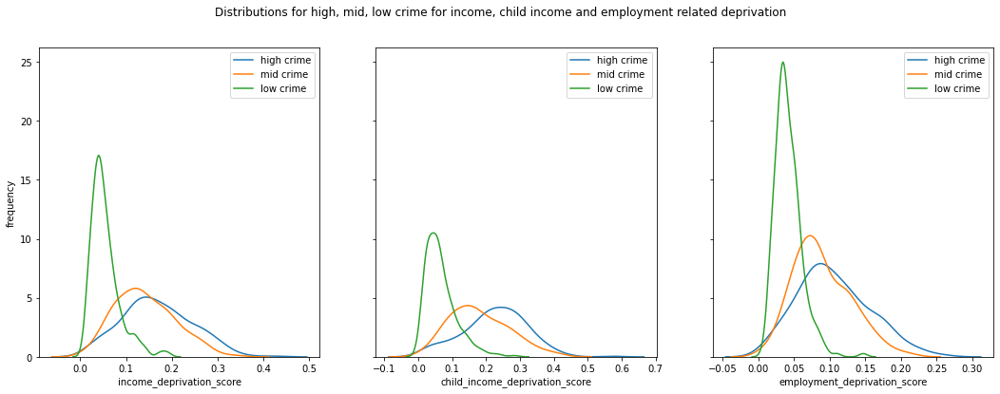

In [17]:
cohort_size = 250
buffer_size = 25

all_cohorts_250 = display_cohort(violence_deprivation, 'crime_per_1000', cohort_size, buffer_size)

#### cohort size = 500


Top 500 proportion = 28.94%, middle 500 proportion = 7.23%, bottom 500 proportion = 1.98% 

cohort shape
(1500, 15)


<Figure size 360x360 with 0 Axes>

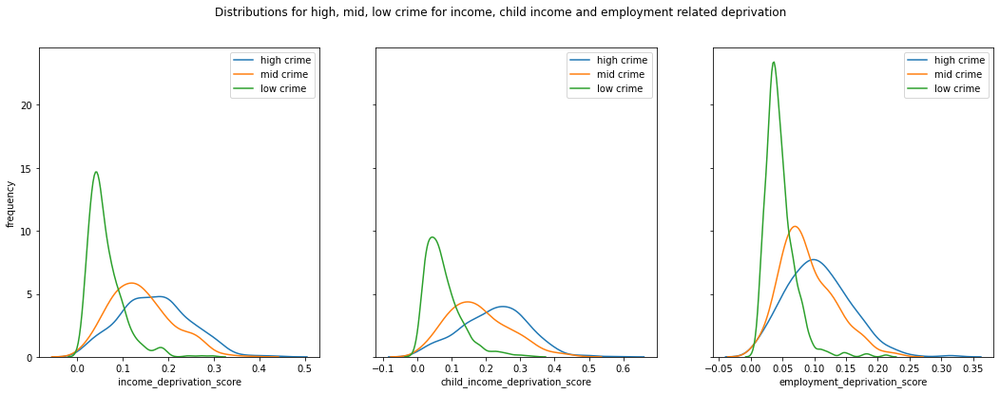

In [18]:
cohort_size = 500
all_cohorts_500 = display_cohort(violence_deprivation, 'crime_per_1000', cohort_size, buffer_size)

#### cohort size = 1000


Top 1000 proportion = 44.37%, middle 1000 proportion = 13.19%, bottom 1000 proportion = 5.66% 

cohort shape
(3000, 15)


<Figure size 360x360 with 0 Axes>

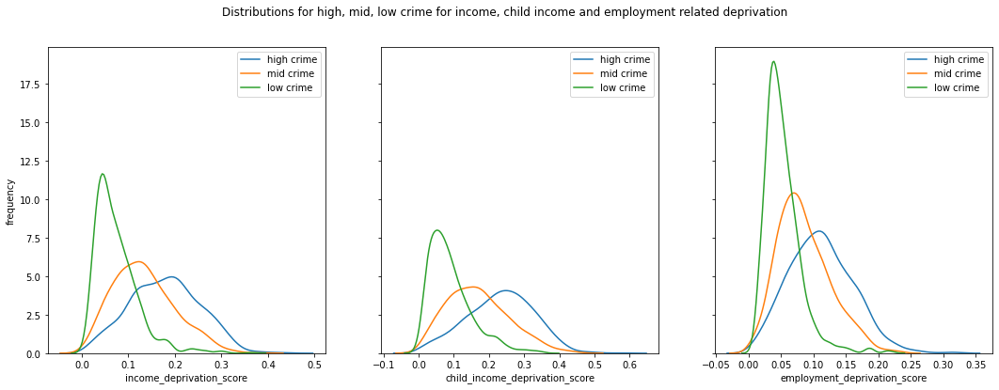

In [19]:
cohort_size = 1000
all_cohorts_1000 = display_cohort(violence_deprivation, 'crime_per_1000', cohort_size, buffer_size)

#### Discussion on Distributions
The high crime cohort for all cohort sizes and feature seem to be most close to normally distributed, have fewer outliers although they have a reasonable high range. Meanwhile the low crime cohorts have the highest number of outliers, mostly on the top side and so this distribution is skewed, with a long positive tail. 

Of the features, income_deprivation distribution is less smooth than that for child_income and employment_deprivation and displays a level of multi modality. For this reason I would have more confidence in our cohen's D results for child income and employment deprivation, but only between high and mid cohorts, given the extent of skew in the low crime cohort's distribution.

### 3.1.2 Cohen's D
Cohen's D requires normal distributions in order to produce reliable results and we believe that we therefore can have more confidence in results for child_income_deprivation and employment_deprivation and specifically between areas having high crime and medium crime. This is based on conclusions formed when discussing the cohort distributions. We will therefore assess just this subset of results.
- We are actually more interested in child income deprivation than income deprivation anyway because, as ONS explain, child income deprivation specifically relates to "the proportion of all children aged 0 to 15 living in income deprived families" and this in turn closely relates to one of the most important correlations in the GLA analysis, which was "proportion of children living in out of work benefit claimant households" 

Now calculate and report Cohen's D:
- For each cohort size: all_cohorts_250, all_cohorts_500 
- (we then retrospectively added all_cohorts_1000)
- For child_income_deprivation and employment_deprivation
- Between high and mid crime cohorts

When assessing effect size, we use the following convention:

- Small Effect Size: d=0.20
- Medium Effect Size: d=0.50
- Large Effect Size: d=0.80

We will also use 2 standard deviations for confidence interval, meaning we have a 95% confidence that the Cohen's D will fall between its upper and lower interval values

The formula for calculating Cohen's D was taken from Data Science course notes (week 04), while the formula for calculating the associated standard deviation for the Cohen's D (and hence the confidence interval) was taken from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5133225/  

In [20]:
import math
def cohens_d(d1, d2, num_stds, description, sample_size):
    # calculate the size of samples
    n1 = len(d1)
    n2 = len(d2)
    
    # calculate the variance of the samples
    s1 = d1.var()
    s2 = d2.var()
    
    # calculate the pooled standard deviation - note that cohen's D uses the 
    # standard deviation squared, but we're using variance, which is the std
    # squares anyway so we use it directly
    s = math.sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
    
    # calculate the means of the samples
    mean_d1 = d1.mean()
    mean_d2 = d2.mean()
    
    # calculate the effect size (which is cohen's d)
    effect_size = (mean_d1 - mean_d2) / s
    
    # now calculate the confidence interval associated with this effect size
    # first calculate its standard deviation (the sample_size for both
    # samples is the same so N1+N2-> 2N and N1*N2 = N squared)
    
    cohens_sigma = math.sqrt( ((2*sample_size) / (sample_size**2)) + \
                        ( (effect_size**2) / (4*sample_size) ) )
    
    cohens_lower = effect_size - num_stds*cohens_sigma
    cohens_upper = effect_size + num_stds*cohens_sigma        

    # create group data ready for inclusion 
    ret_data = {'description': description,
     'effect_size': "{0:.4f}".format(effect_size), 
     'cohens_lower': "{0:.4f}".format(cohens_lower),
     'cohens_upper': "{0:.4f}".format(cohens_upper)
    }
                
    return ret_data

In [21]:
# create our dataframe to store results
cohens_d_results = pd.DataFrame(columns=['description',
                                         'effect_size',
                                         'cohens_lower',
                                         'cohens_upper']) 

# all_cohorts_250
num_stds = 2
sample_size = 250

all_cohorts = all_cohorts_250
all_cohorts_high = all_cohorts[all_cohorts.crime_cohort == 'high']
all_cohorts_mid = all_cohorts[all_cohorts.crime_cohort == 'mid']

cohens_d_results = cohens_d_results.append(cohens_d(all_cohorts_high.child_income_deprivation_score,
                                              all_cohorts_mid.child_income_deprivation_score, num_stds, 
                                              'child income(250): high vs mid', sample_size), ignore_index=True)
cohens_d_results = cohens_d_results.append(cohens_d(all_cohorts_high.employment_deprivation_score,
                                              all_cohorts_mid.employment_deprivation_score, num_stds, 
                                              'employment(250): high vs mid', sample_size), ignore_index=True)

# all_cohorts_500
num_stds = 2
sample_size = 500

all_cohorts = all_cohorts_500
all_cohorts_high = all_cohorts[all_cohorts.crime_cohort == 'high']
all_cohorts_mid = all_cohorts[all_cohorts.crime_cohort == 'mid']

cohens_d_results = cohens_d_results.append(cohens_d(all_cohorts_high.child_income_deprivation_score,
                                              all_cohorts_mid.child_income_deprivation_score, num_stds, 
                                              'child income(500): high vs mid', sample_size), ignore_index=True)
cohens_d_results = cohens_d_results.append(cohens_d(all_cohorts_high.employment_deprivation_score,
                                              all_cohorts_mid.employment_deprivation_score, num_stds, 
                                              'employment(500): high vs mid', sample_size), ignore_index=True)


# all_cohorts_1000
num_stds = 2
sample_size = 1000

all_cohorts = all_cohorts_1000
all_cohorts_high = all_cohorts[all_cohorts.crime_cohort == 'high']
all_cohorts_mid = all_cohorts[all_cohorts.crime_cohort == 'mid']

cohens_d_results = cohens_d_results.append(cohens_d(all_cohorts_high.child_income_deprivation_score,
                                              all_cohorts_mid.child_income_deprivation_score, num_stds, 
                                              'child income(1000): high vs mid', sample_size), ignore_index=True)
cohens_d_results = cohens_d_results.append(cohens_d(all_cohorts_high.employment_deprivation_score,
                                              all_cohorts_mid.employment_deprivation_score, num_stds, 
                                              'employment(1000): high vs mid', sample_size), ignore_index=True)

In [22]:
cohens_d_tidy = pd.melt(cohens_d_results, id_vars=['description'], 
                        value_vars=['effect_size', 
                                    'cohens_lower',
                                    'cohens_upper'], var_name = 'measure', value_name='value')

### Plot the effect size and CI by cohort
This plot was inspired by code taken from
https://www.kaggle.com/raenish/cheatsheet-100-altair-plots-part-1-basic/

In [64]:
measures_ = ["cohens_lower", "cohens_upper", "effect_size"]
measure_colours_ = ["rgb(51,171,249)", "rgb(51,171,249)", "firebrick"]
colours_obj_1 = alt.Color("measure:N", scale=alt.Scale(domain=measures_, range=measure_colours_), legend=None)

chart = alt.layer(
    data=cohens_d_tidy
)

chart += alt.Chart().mark_line(color='grey').encode(
    x=alt.X('value:Q', axis=alt.Axis(title='effect size and upper/lower bounds', ticks=False,values=[0, 0.2, 0.4, 0.6, 0.8])),
    y=alt.Y('description:N', axis=alt.Axis(title=None, ticks=False), sort='-x'),
    detail='description:N'
).properties(title="Cohens D: effect size and confidence interval",width=400,height=200)

chart += alt.Chart().mark_point(
    size=100,
    opacity=1,
    filled=True
).encode(
    x=alt.X('value:Q', axis=alt.Axis(title='effect size and upper/lower bounds', ticks=False,values=[0, 0.2, 0.4, 0.6, 0.8])),
    y=alt.Y('description:N', axis=alt.Axis(title=None, ticks=False), sort='-x'),
    color=colours_obj_1,
    tooltip=['description:N','measure:N','value:Q']
)

chart.configure_axis(
    grid=False,
    domain=False
).configure_view(
    strokeWidth=0)

alt.LayerChart(...)

In [48]:
cohens_d_results.sort_values(by='effect_size', ascending=False)

,description,effect_size,cohens_lower,cohens_upper
4,child income(1000): high vs mid,0.6948,0.6027,0.7869
5,employment(1000): high vs mid,0.5823,0.4910,0.6736
0,child income(250): high vs mid,0.5049,0.3232,0.6866
2,child income(500): high vs mid,0.5018,0.3734,0.6303
3,employment(500): high vs mid,0.3779,0.2503,0.5055
1,employment(250): high vs mid,0.3615,0.1812,0.5419


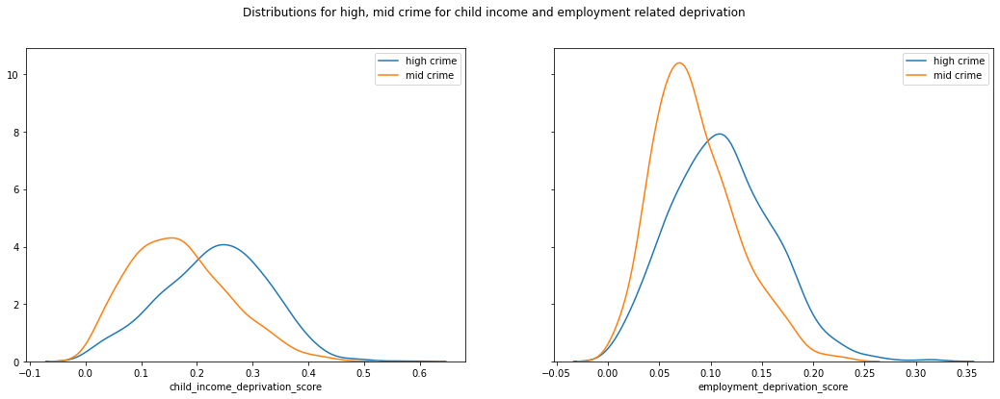

In [60]:
display_child_employment_distributions(all_cohorts_1000)

## 4. Conclusions
Previously we discussed that when assessing effect size, we use the following convention:
- Small Effect Size: d=0.20
- Medium Effect Size: d=0.50
- Large Effect Size: d=0.80

Child income deprivation has an effect on the levels of crime in an area, namely the higher the deprivation the higher the level of serious violent crime:
- If we consider a cohort_size = 1000, we can say we have a 95% confidence that there is a medium to large effect size in the child income deprivation between high and mid level crime areas.
- We can see child_income_deprivation has a minium effect size of 0.5, irrespective of cohort size. This is a medium effect size, and if we go to the lower bound of the confidence interval get a value of 0.32, which is a small effect size. So, for child_income_deprivation we can say we have a 95% confidence that there is a minimum of a small effect, irrespective of cohort size. 

Employment deprivation has an effect on the levels of serious violent crime in an area:
- If we consider a cohort size = 1000 then we have a 95% confidence that there is a medium effect in the levels of serious violent crime.

We believe the reason that larger cohort sizes produce stronger cohen's D results is two fold:
- the standard deviation in feature values for the smaller cohort size is greater and this reduces the effect size - we can see this in the earlier KDE plots. This seems logical because we know how skewed the crime levels are, particularly for high crime, given that 4% of all serious violent crime took place in 10 LSOAs and so this will lead to larger standard deviations, particularly when the cohort size is small.
- the sample size is part of the divisor in the cohen's D standard deviation calculation and so a larger sample size will lead to a smaller standard deviation and hence a smaller confidence interval. 

## Things still to do on inferential statistics
   
1. Is there anything we want to explain about 250 cohort size having moderate effect size (we know the sample size increases the size of the confidence interval)
2. Definitely need to cycle around again and do the following at borough level - knife crime data, exclusions, children in care, police numbers, police clean up rates and also add in child, income and employment deprivation aggregated to borough level
    - explain we know that crime is more local, but we are just investigating because it's only level for which we have data
    - also explain that we would like to have seen police numbers and clean up rates change over time
3. Maybe, if I have time, look into how child, income, employment deprivation has changed between 2010 and 2019 and see whether there is a correlation between areas with biggest increase and the levels of crime.


## Prepare data for next stage - random forest classifier
Create a dataset comprising, for all LSOAs, socioeconomic characteristics (features) and the rate of serious violent crime per 1000 inhabitants

In [45]:
violence_features_master = pd.merge(crimes_subset_new, london_features, left_on='lsoa_code', 
                            right_on='lsoa_code', how = 'inner')

violence_features_master.rename(columns = {'lsoa_name_x':'lsoa_name'}, inplace = True)
violence_features_master.drop('lsoa_name_y', axis=1, inplace=True)

print(violence_features_master.shape)
violence_features_master.head()

(4823, 35)


,lsoa_code,borough,ldn_datastore_total,police_total,LSOA Code,lsoa_name,population,crime_per_1000,crime_per_1000_proportion,lad_code,...,degree_educated_pct,population_density,median_house_price,living_environment_rank,log_rent_social_pct,log_ethnic_other_pct,log_population_density,log_median_house_price,log_ethnic_black_pct,log_ethnic_asian_pct
0,E01000006,Barking and Dagenham,27,50.0,E01000006,Barking and Dagenham 016A,2094,12.893983,0.218365,E09000002,...,0.329,0.144255,0.034776,0.368210,-3.411248,-3.528124,-1.936171,-3.358826,-2.263997,-0.682052
1,E01000007,Barking and Dagenham,130,188.0,E01000007,Barking and Dagenham 015A,2502,51.958433,0.879936,E09000002,...,0.323,0.093529,0.010444,0.386675,-0.898942,-3.905574,-2.369485,-4.561768,-1.274199,-1.135220
2,E01000008,Barking and Dagenham,23,89.0,E01000008,Barking and Dagenham 015B,1597,14.402004,0.243903,E09000002,...,0.242,0.100393,0.012705,0.300409,-0.406466,-3.371840,-2.298662,-4.365794,-0.989502,-1.487060
3,E01000009,Barking and Dagenham,52,115.0,E01000009,Barking and Dagenham 016B,1929,26.956973,0.456527,E09000002,...,0.350,0.167821,0.012705,0.332941,-1.584745,-3.588608,-1.784857,-4.365794,-2.051083,-0.560744
4,E01000010,Barking and Dagenham,211,430.0,E01000010,Barking and Dagenham 015C,3579,58.955015,0.998426,E09000002,...,0.449,0.111747,0.013775,0.078575,-1.343235,-3.408265,-2.191522,-4.284878,-1.588531,-0.857324


In [46]:
violence_features_master.to_csv('./DataSources/Income and Deprivation/violence_features_master.csv', index=False)